## Project 8: Convolutions, Blurring & Sharpening

### 8.1 Overview

In this project, we work with a slightly blurry image to understand noise reduction and detail restoration. I'll explore whether Gaussian blur is the best filter for noise reduction, apply sharpening to restore details, research different types of image noise, and demonstrate noise reduction techniques by artificially adding noise to a clean image.

---

### 8.2 Objectives

- Apply Gaussian blur to reduce noise and evaluate if it's the best filter
- Apply sharpening filter to restore details in the blurry image
- Research different types of noise in digital images
- Identify appropriate filters for different noise types
- Create artificial noise on a clean image and demonstrate noise reduction techniques
- Compare results and understand when to use each filter

---
### 8.3 Step 1: Load and Display the Slightly Blurry Image

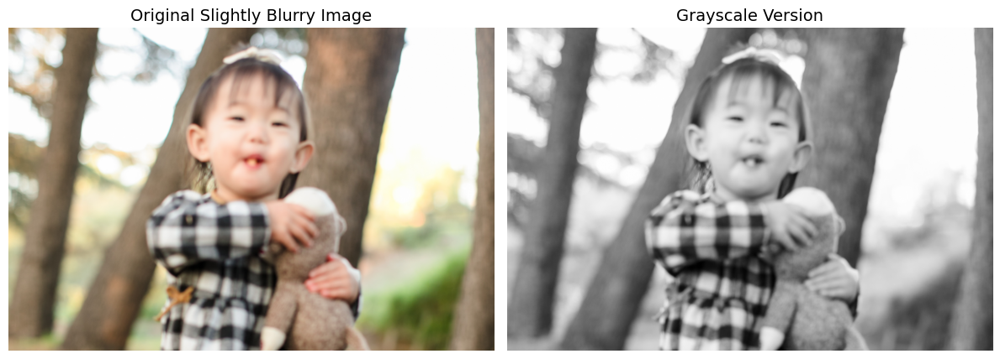

Image shape: (1000, 1500, 3)
Image dtype: uint8


In [8]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load a slightly blurry image
image = cv2.imread('images/blurry_photo.jpg')

# Display the original blurry image
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.title('Original Slightly Blurry Image', fontsize=14)
plt.axis('off')

# Convert to grayscale for analysis
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
plt.subplot(1, 2, 2)
plt.imshow(gray, cmap='gray')
plt.title('Grayscale Version', fontsize=14)
plt.axis('off')

plt.tight_layout()
plt.show()

print(f"Image shape: {image.shape}")
print(f"Image dtype: {image.dtype}")

### 8.4 Step 2: Apply Gaussian Blur for Noise Reduction

#### 8.4.1 Applying Gaussian Blur

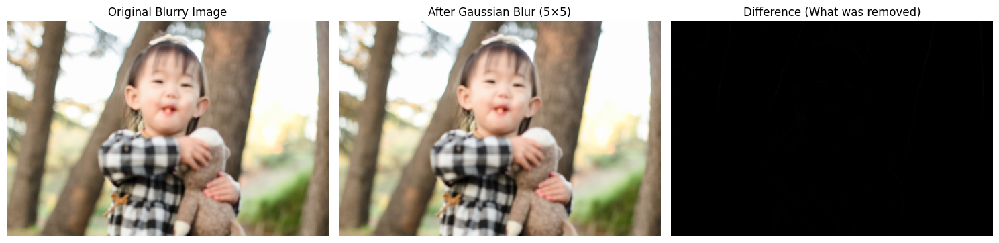

In [9]:
# Apply Gaussian blur
gaussian_blurred = cv2.GaussianBlur(image, (5, 5), 0)

# Display comparison
plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.title('Original Blurry Image', fontsize=12)
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(cv2.cvtColor(gaussian_blurred, cv2.COLOR_BGR2RGB))
plt.title('After Gaussian Blur (5×5)', fontsize=12)
plt.axis('off')

plt.subplot(1, 3, 3)
# Compute difference to see what was removed
difference = cv2.absdiff(image, gaussian_blurred)
plt.imshow(cv2.cvtColor(difference, cv2.COLOR_BGR2RGB))
plt.title('Difference (What was removed)', fontsize=12)
plt.axis('off')

plt.tight_layout()
plt.show()

#### 8.4.2 Compare different filters on the same image

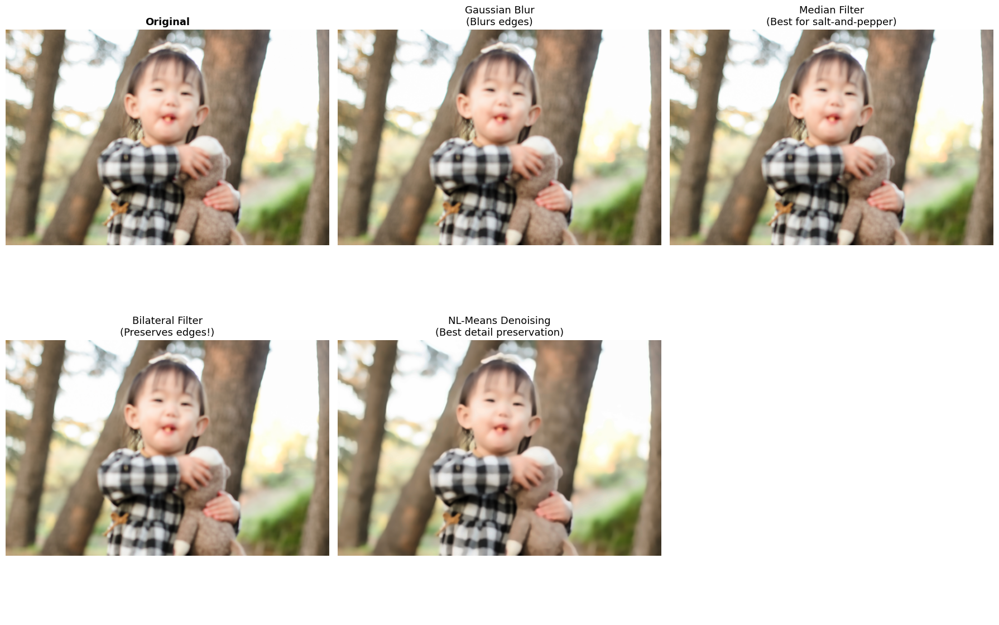


CONCLUSION: Is Gaussian Blur the best filter?
❌ NO! For noise reduction, better options exist:
   • Median Filter: Best for salt-and-pepper noise
   • Bilateral Filter: Preserves edges while smoothing
   • NL-Means: Best overall quality but slowest
   • Gaussian Blur: Only good for Gaussian noise, blurs edges


In [10]:
median_filtered = cv2.medianBlur(image, 5)
bilateral_filtered = cv2.bilateralFilter(image, 9, 75, 75)
nlm_denoised = cv2.fastNlMeansDenoisingColored(image, None, 10, 10, 7, 21)

# Display all filters
fig, axes = plt.subplots(2, 3, figsize=(18, 12))

axes[0, 0].imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
axes[0, 0].set_title('Original', fontsize=13, fontweight='bold')
axes[0, 0].axis('off')

axes[0, 1].imshow(cv2.cvtColor(gaussian_blurred, cv2.COLOR_BGR2RGB))
axes[0, 1].set_title('Gaussian Blur\n(Blurs edges)', fontsize=13)
axes[0, 1].axis('off')

axes[0, 2].imshow(cv2.cvtColor(median_filtered, cv2.COLOR_BGR2RGB))
axes[0, 2].set_title('Median Filter\n(Best for salt-and-pepper)', fontsize=13)
axes[0, 2].axis('off')

axes[1, 0].imshow(cv2.cvtColor(bilateral_filtered, cv2.COLOR_BGR2RGB))
axes[1, 0].set_title('Bilateral Filter\n(Preserves edges!)', fontsize=13)
axes[1, 0].axis('off')

axes[1, 1].imshow(cv2.cvtColor(nlm_denoised, cv2.COLOR_BGR2RGB))
axes[1, 1].set_title('NL-Means Denoising\n(Best detail preservation)', fontsize=13)
axes[1, 1].axis('off')

axes[1, 2].axis('off')

plt.tight_layout()
plt.show()

print("\n" + "="*70)
print("CONCLUSION: Is Gaussian Blur the best filter?")
print("="*70)
print("❌ NO! For noise reduction, better options exist:")
print("   • Median Filter: Best for salt-and-pepper noise")
print("   • Bilateral Filter: Preserves edges while smoothing")
print("   • NL-Means: Best overall quality but slowest")
print("   • Gaussian Blur: Only good for Gaussian noise, blurs edges")
print("="*70)

### 8.5 Step 3: Apply Sharpening to Restore Details

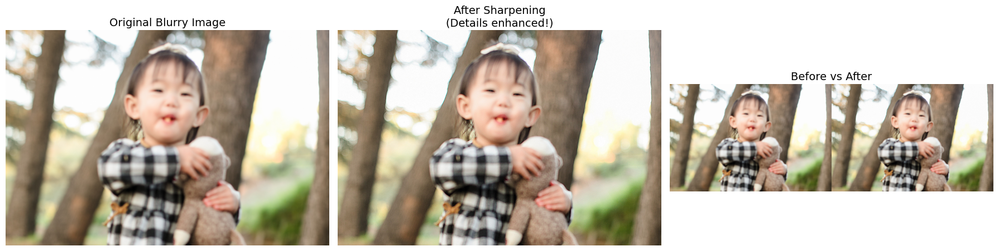

✓ Sharpening applied successfully!
Notice how edges and details are now more pronounced.


In [11]:
# Create sharpening kernel
kernel_sharpening = np.array([[-1, -1, -1],
                              [-1,  9, -1],
                              [-1, -1, -1]])

# Apply sharpening to the original blurry image
sharpened = cv2.filter2D(image, -1, kernel_sharpening)

# Display results
plt.figure(figsize=(18, 6))

plt.subplot(1, 3, 1)
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.title('Original Blurry Image', fontsize=14)
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(cv2.cvtColor(sharpened, cv2.COLOR_BGR2RGB))
plt.title('After Sharpening\n(Details enhanced!)', fontsize=14)
plt.axis('off')

plt.subplot(1, 3, 3)
# Side-by-side comparison
h, w = image.shape[:2]
comparison = np.hstack([
    cv2.cvtColor(image, cv2.COLOR_BGR2RGB),
    cv2.cvtColor(sharpened, cv2.COLOR_BGR2RGB)
])
plt.imshow(comparison)
plt.title('Before vs After', fontsize=14)
plt.axis('off')

plt.tight_layout()
plt.show()

print("✓ Sharpening applied successfully!")
print("Notice how edges and details are now more pronounced.")

#### 8.5.1 The Optimal Workflow: Denoise THEN Sharpen


BEST PRACTICE: Denoise first, then sharpen!


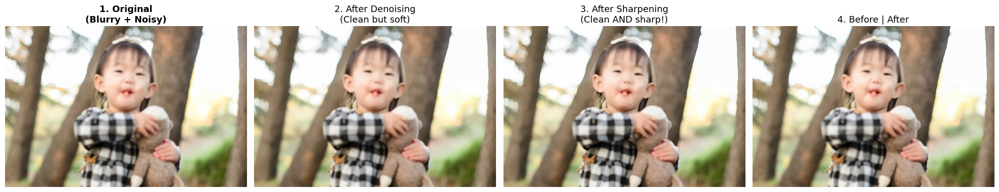

✓ Workflow complete:
  1. Denoising removed noise while preserving structure
  2. Sharpening restored crisp edges and details
  Result: Best of both worlds! ✅


In [12]:
print("\n" + "="*70)
print("BEST PRACTICE: Denoise first, then sharpen!")
print("="*70)

# Step 1: Denoise (remove noise)
denoised = cv2.fastNlMeansDenoisingColored(image, None, 6, 6, 7, 21)

# Step 2: Sharpen (restore details)
final_result = cv2.filter2D(denoised, -1, kernel_sharpening)

# Display the complete workflow
fig, axes = plt.subplots(1, 4, figsize=(20, 5))

axes[0].imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
axes[0].set_title('1. Original\n(Blurry + Noisy)', fontsize=13, fontweight='bold')
axes[0].axis('off')

axes[1].imshow(cv2.cvtColor(denoised, cv2.COLOR_BGR2RGB))
axes[1].set_title('2. After Denoising\n(Clean but soft)', fontsize=13)
axes[1].axis('off')

axes[2].imshow(cv2.cvtColor(final_result, cv2.COLOR_BGR2RGB))
axes[2].set_title('3. After Sharpening\n(Clean AND sharp!)', fontsize=13)
axes[2].axis('off')

# Compare original vs final
axes[3].imshow(np.hstack([
    cv2.cvtColor(image, cv2.COLOR_BGR2RGB)[:, :w//2],
    cv2.cvtColor(final_result, cv2.COLOR_BGR2RGB)[:, w//2:]
]))
axes[3].set_title('4. Before | After', fontsize=13)
axes[3].axis('off')

plt.tight_layout()
plt.show()

print("✓ Workflow complete:")
print("  1. Denoising removed noise while preserving structure")
print("  2. Sharpening restored crisp edges and details")
print("  Result: Best of both worlds! ✅")

#### 8.6 Step 4: Research on Noise Types in Digital Images

# Noise Types and Recommended Filters

| Noise Type | Characteristics | Common Causes | Best Filter | Difficulty |
|------------|----------------|---------------|-------------|------------|
| Gaussian | Random brightness variations | Sensor noise, high ISO | NL-Means, Bilateral | Easy |
| Salt-and-Pepper | Random black/white pixels | Transmission errors | Median Filter | Easy |
| Poisson | Intensity-dependent | Low light, photon counting | Anscombe + Gaussian | Medium |
| Speckle | Multiplicative, granular | Coherent imaging (radar) | Lee, Frost, Bilateral | Medium |
| Periodic | Regular patterns | Electrical interference | FFT, Notch filter | Hard |

#### 8.7 Step 5: Artificial Noise Creation and Removal Demonstration

##### 8.7.1 Load a Clean Image

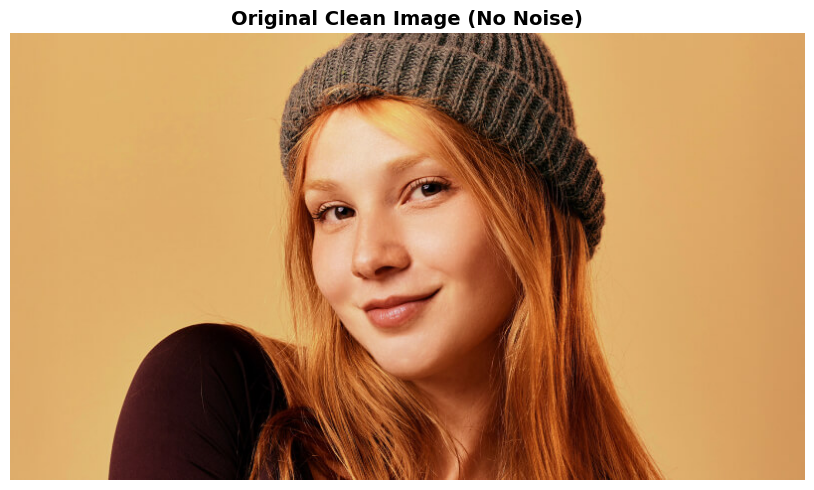

Clean image shape: (450, 800, 3)


In [14]:
clean_image = cv2.imread('images/clean_image.jpg')

plt.figure(figsize=(10, 5))
plt.imshow(cv2.cvtColor(clean_image, cv2.COLOR_BGR2RGB))
plt.title('Original Clean Image (No Noise)', fontsize=14, fontweight='bold')
plt.axis('off')
plt.tight_layout()
plt.show()

print(f"Clean image shape: {clean_image.shape}")

##### 8.7.2 Add Gaussian Noise

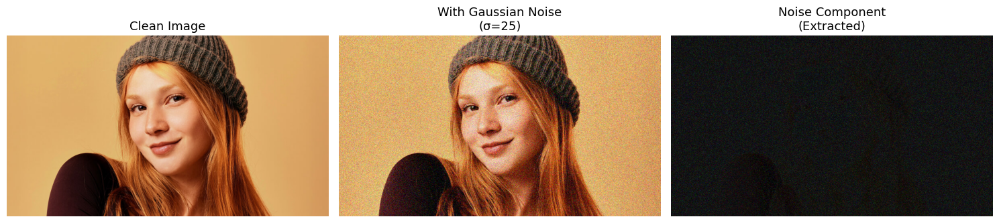

✓ Gaussian noise added successfully!


In [15]:
def add_gaussian_noise(image, mean=0, sigma=25):
    """
    Add Gaussian noise to an image.
    
    Parameters:
    - mean: Mean of Gaussian distribution (usually 0)
    - sigma: Standard deviation (noise strength)
    """
    gaussian_noise = np.random.normal(mean, sigma, image.shape)
    noisy_image = image + gaussian_noise
    noisy_image = np.clip(noisy_image, 0, 255).astype(np.uint8)
    return noisy_image

# Add Gaussian noise
gaussian_noisy = add_gaussian_noise(clean_image, mean=0, sigma=25)

# Display
plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)
plt.imshow(cv2.cvtColor(clean_image, cv2.COLOR_BGR2RGB))
plt.title('Clean Image', fontsize=13)
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(cv2.cvtColor(gaussian_noisy, cv2.COLOR_BGR2RGB))
plt.title('With Gaussian Noise\n(σ=25)', fontsize=13)
plt.axis('off')

plt.subplot(1, 3, 3)
noise_only = cv2.absdiff(clean_image, gaussian_noisy)
plt.imshow(cv2.cvtColor(noise_only, cv2.COLOR_BGR2RGB))
plt.title('Noise Component\n(Extracted)', fontsize=13)
plt.axis('off')

plt.tight_layout()
plt.show()

print("✓ Gaussian noise added successfully!")

##### 8.7.3 Add Salt-and-Pepper Noise

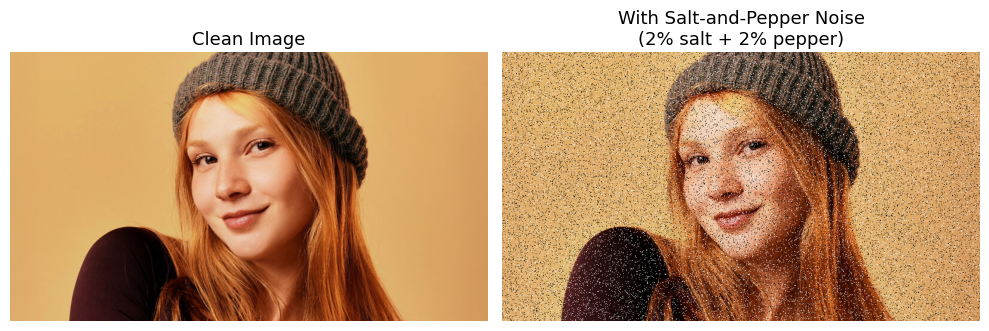

✓ Salt-and-pepper noise added successfully!


In [16]:
def add_salt_pepper_noise(image, salt_prob=0.01, pepper_prob=0.01):
    """
    Add salt-and-pepper noise to an image.
    
    Parameters:
    - salt_prob: Probability of white pixels (0-1)
    - pepper_prob: Probability of black pixels (0-1)
    """
    noisy_image = image.copy()
    
    # Total number of pixels
    total_pixels = image.size
    
    # Add salt (white pixels)
    num_salt = int(total_pixels * salt_prob)
    salt_coords = [np.random.randint(0, i, num_salt) for i in image.shape[:2]]
    noisy_image[salt_coords[0], salt_coords[1], :] = 255
    
    # Add pepper (black pixels)
    num_pepper = int(total_pixels * pepper_prob)
    pepper_coords = [np.random.randint(0, i, num_pepper) for i in image.shape[:2]]
    noisy_image[pepper_coords[0], pepper_coords[1], :] = 0
    
    return noisy_image

# Add salt-and-pepper noise
sp_noisy = add_salt_pepper_noise(clean_image, salt_prob=0.02, pepper_prob=0.02)

# Display
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(clean_image, cv2.COLOR_BGR2RGB))
plt.title('Clean Image', fontsize=13)
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(sp_noisy, cv2.COLOR_BGR2RGB))
plt.title('With Salt-and-Pepper Noise\n(2% salt + 2% pepper)', fontsize=13)
plt.axis('off')

plt.tight_layout()
plt.show()

print("✓ Salt-and-pepper noise added successfully!")

#### 8.7.4 Remove Gaussian Noise - Filter Comparison

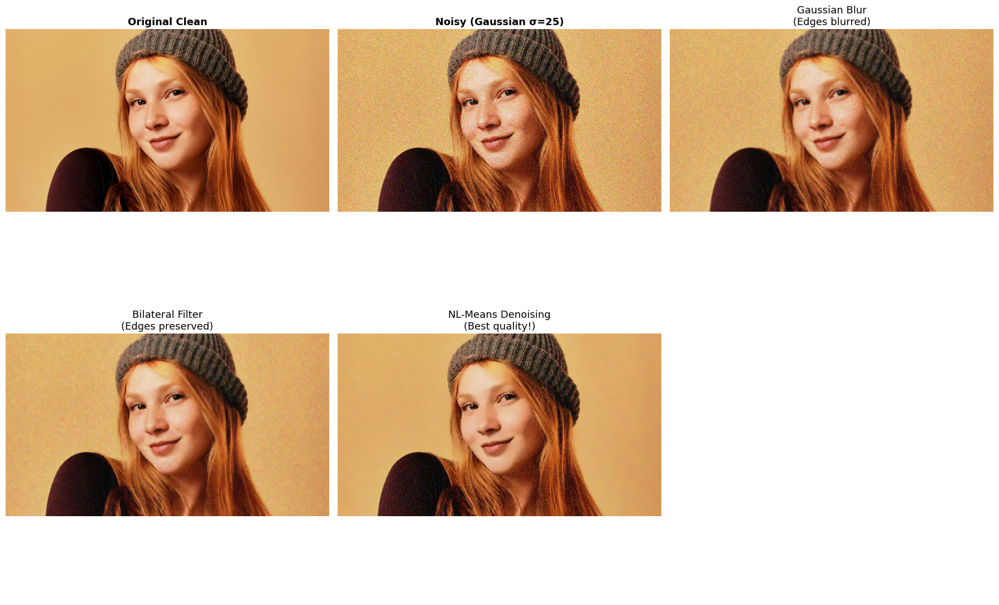


GAUSSIAN NOISE REMOVAL COMPARISON
✓ Gaussian Blur: Fast but blurs edges
✓ Bilateral Filter: Good edge preservation
✓ NL-Means: Best quality but slowest


In [17]:
# Apply different filters to Gaussian noisy image
gauss_blur = cv2.GaussianBlur(gaussian_noisy, (5, 5), 0)
bilateral = cv2.bilateralFilter(gaussian_noisy, 9, 75, 75)
nlm_denoised = cv2.fastNlMeansDenoisingColored(gaussian_noisy, None, 10, 10, 7, 21)

# Display all results
fig, axes = plt.subplots(2, 3, figsize=(18, 12))

axes[0, 0].imshow(cv2.cvtColor(clean_image, cv2.COLOR_BGR2RGB))
axes[0, 0].set_title('Original Clean', fontsize=13, fontweight='bold')
axes[0, 0].axis('off')

axes[0, 1].imshow(cv2.cvtColor(gaussian_noisy, cv2.COLOR_BGR2RGB))
axes[0, 1].set_title('Noisy (Gaussian σ=25)', fontsize=13, fontweight='bold')
axes[0, 1].axis('off')

axes[0, 2].imshow(cv2.cvtColor(gauss_blur, cv2.COLOR_BGR2RGB))
axes[0, 2].set_title('Gaussian Blur\n(Edges blurred)', fontsize=13)
axes[0, 2].axis('off')

axes[1, 0].imshow(cv2.cvtColor(bilateral, cv2.COLOR_BGR2RGB))
axes[1, 0].set_title('Bilateral Filter\n(Edges preserved)', fontsize=13)
axes[1, 0].axis('off')

axes[1, 1].imshow(cv2.cvtColor(nlm_denoised, cv2.COLOR_BGR2RGB))
axes[1, 1].set_title('NL-Means Denoising\n(Best quality!)', fontsize=13)
axes[1, 1].axis('off')

axes[1, 2].axis('off')

plt.tight_layout()
plt.show()

print("\n" + "="*70)
print("GAUSSIAN NOISE REMOVAL COMPARISON")
print("="*70)
print("✓ Gaussian Blur: Fast but blurs edges")
print("✓ Bilateral Filter: Good edge preservation")
print("✓ NL-Means: Best quality but slowest")
print("="*70)

##### 8.7.5 Remove Salt-and-Pepper Noise - Filter Comparison

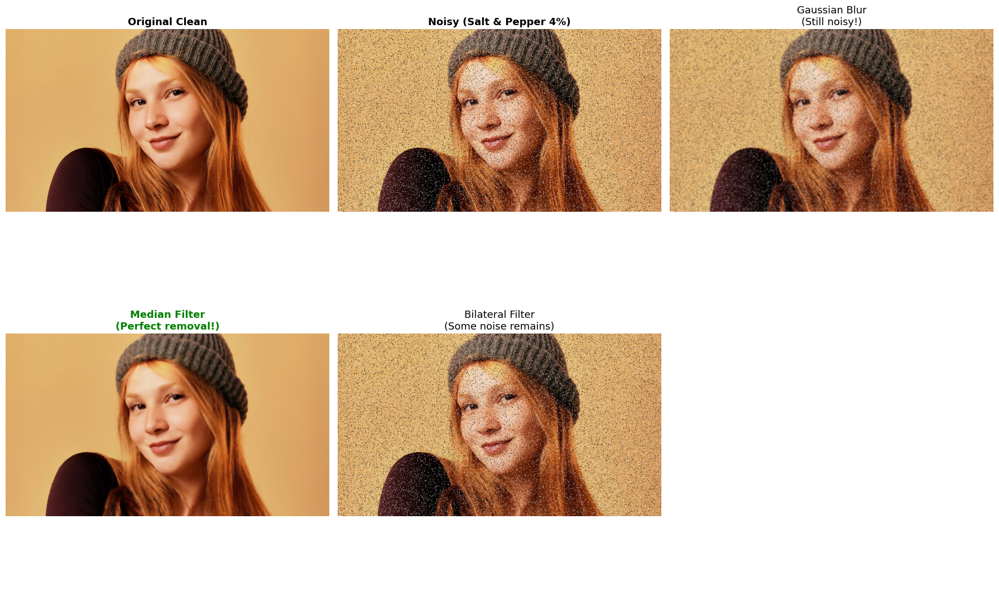


SALT-AND-PEPPER NOISE REMOVAL COMPARISON
❌ Gaussian Blur: Doesn't work well (smears noise)
✅ Median Filter: PERFECT for salt-and-pepper noise!
⚠️  Bilateral Filter: Partially works but not optimal

CONCLUSION: Always use Median Filter for salt-and-pepper noise!


In [18]:
# Apply different filters to salt-and-pepper noisy image
sp_gauss_blur = cv2.GaussianBlur(sp_noisy, (5, 5), 0)
sp_median = cv2.medianBlur(sp_noisy, 5)
sp_bilateral = cv2.bilateralFilter(sp_noisy, 9, 75, 75)

# Display all results
fig, axes = plt.subplots(2, 3, figsize=(18, 12))

axes[0, 0].imshow(cv2.cvtColor(clean_image, cv2.COLOR_BGR2RGB))
axes[0, 0].set_title('Original Clean', fontsize=13, fontweight='bold')
axes[0, 0].axis('off')

axes[0, 1].imshow(cv2.cvtColor(sp_noisy, cv2.COLOR_BGR2RGB))
axes[0, 1].set_title('Noisy (Salt & Pepper 4%)', fontsize=13, fontweight='bold')
axes[0, 1].axis('off')

axes[0, 2].imshow(cv2.cvtColor(sp_gauss_blur, cv2.COLOR_BGR2RGB))
axes[0, 2].set_title('Gaussian Blur\n(Still noisy!)', fontsize=13)
axes[0, 2].axis('off')

axes[1, 0].imshow(cv2.cvtColor(sp_median, cv2.COLOR_BGR2RGB))
axes[1, 0].set_title('Median Filter\n(Perfect removal!)', fontsize=13, color='green', fontweight='bold')
axes[1, 0].axis('off')

axes[1, 1].imshow(cv2.cvtColor(sp_bilateral, cv2.COLOR_BGR2RGB))
axes[1, 1].set_title('Bilateral Filter\n(Some noise remains)', fontsize=13)
axes[1, 1].axis('off')

axes[1, 2].axis('off')

plt.tight_layout()
plt.show()

print("\n" + "="*70)
print("SALT-AND-PEPPER NOISE REMOVAL COMPARISON")
print("="*70)
print("❌ Gaussian Blur: Doesn't work well (smears noise)")
print("✅ Median Filter: PERFECT for salt-and-pepper noise!")
print("⚠️  Bilateral Filter: Partially works but not optimal")
print("="*70)
print("\nCONCLUSION: Always use Median Filter for salt-and-pepper noise!")